# Introduction to Image Processing

Mojdeh Rastgoo - Guillaume Lemaitre - Desire Sidibe

## **Spatial Filtering and de-noising**

The modules which are commonly used are entered in the following cell.

In [1]:
%matplotlib inline
#%pprint off

# Matplotlib library
import matplotlib.pyplot as plt
from matplotlib import cm

# Numpy library
import numpy as np

from skimage import io 
from skimage import img_as_ubyte
from skimage import img_as_float
from skimage import color 

# import the function to add some noise
from skimage.util import random_noise

# For skimage.filter.rank.mean, skimage.morphology.disk and ndimage.filters.convolve
from skimage.morphology import disk
from skimage.filters.rank import mean,mean_percentile,median
from skimage.transform import probabilistic_hough_line, hough_line,hough_line_peaks
from scipy import ndimage


In [2]:
Path = './images/'
lena_im = io.imread(Path.__add__('lena-grey.bmp'))
lena_im = img_as_float(lena_im)

## Smoothing

### Mean filter 
Smooth the lena image, by mean filter, using different disk circles with radius of $ r = 1, 3, 5, 7$

Use [`skimage.filter.rank.mean`](http://scikit-image.org/docs/dev/api/skimage.filters.rank.html#skimage.filters.rank.mean) and [`skimage.morphology.disk`](http://scikit-image.org/docs/dev/api/skimage.morphology.html#skimage.morphology.disk) function 

C:\Program Files\Anaconda3\lib\site-packages\skimage\util\dtype.py:110: UserWarning: Possible precision loss when converting from float64 to uint8
  "%s to %s" % (dtypeobj_in, dtypeobj))


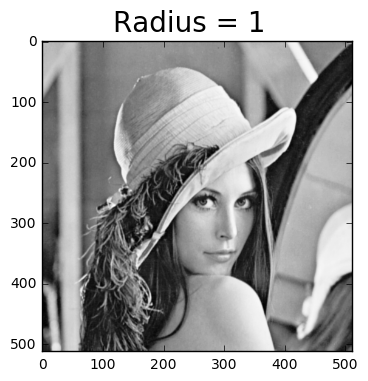

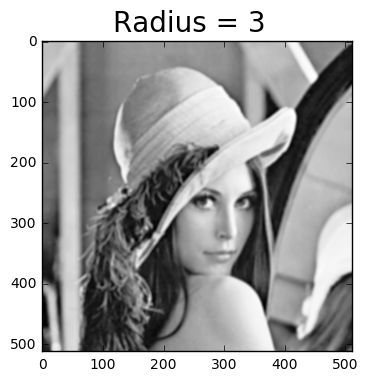

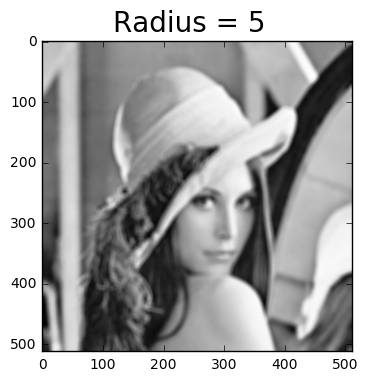

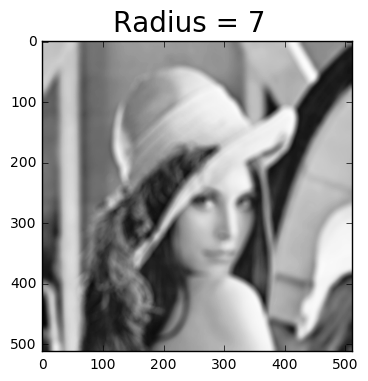

In [3]:
fig1 = plt.figure(1)
fig1.suptitle('Radius = 1', fontsize=20)
plt.imshow(mean(lena_im,disk(1)),cmap=cm.Greys_r)


fig2 = plt.figure(2)
fig2.suptitle('Radius = 3', fontsize=20)
plt.imshow(mean(lena_im,disk(3)),cmap=cm.Greys_r)


fig3 = plt.figure(3)
fig3.suptitle('Radius = 5', fontsize=20)
plt.imshow(mean(lena_im,disk(5)),cmap=cm.Greys_r)


fig4 = plt.figure(4)
fig4.suptitle('Radius = 7', fontsize=20)
plt.imshow(mean(lena_im,disk(7)),cmap=cm.Greys_r)



### Filtering using convolution 
Once again apply the mean fiter, howver instead of using `filter.rank` make your mean mask having the same size as the last filter you applied and use convolution to apply the filter. 

The function [`ndimage.filters.convolve`](http://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.filters.convolve.html#scipy.ndimage.filters.convolve) from `scipy` allows to compute the convolution between a mask (filter) and an image.

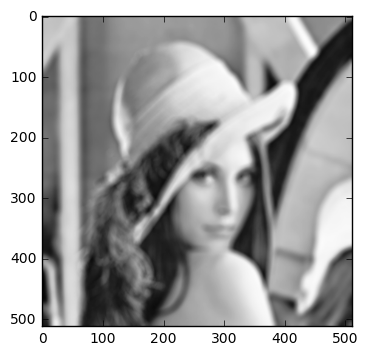

In [4]:
plt.imshow(ndimage.filters.convolve(lena_im,disk(7)),cmap=cm.Greys_r)

Any filtering will work is a similar manner. Only the mask (filter) will change and will define the nature of the filtering.

### Common spatial filtering

In this section, you will learn about spatial filters which are commonly used in image processing. These filters were already implemented in `skimage` and can be directly used without applying the previous processing.

The modules `filters` and `filters.rank` implement well known filters.

In [5]:
from skimage import filters

#####  First-order edge detector

You already saw during the lecture the following edge detectors: (i) Roberts, (ii) Prewitt, and (iii) Sobel.
All these operators are an approximation of the first derivative. They are highly sensitive to noise even if Prewitt and Sobel have a smoothing process embedded.

Scharr opearator as an improved version of Sobel such that the operator provides a rotational symmetry.

The following functions are defined in `skimage`: `filters.roberts`, `filters.prewitt`, `filters.sobel`, and `filters.scharr`. 

**Apply these different filters on Leaves image (`leaves.jpg`).**

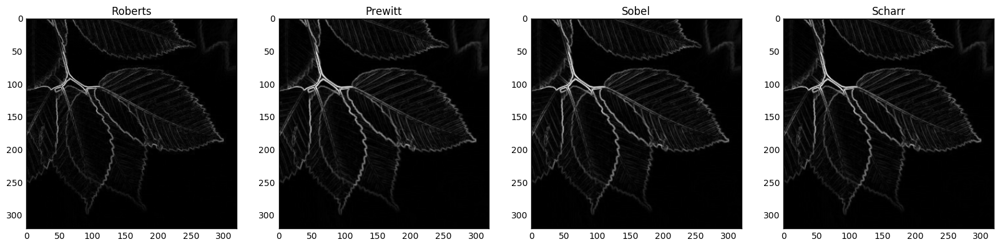

In [6]:
leaves = io.imread(Path.__add__('leaves.jpg'))
leaves=color.rgb2grey(leaves)
leaves = img_as_float(leaves)

fig1 = plt.figure(figsize=(20,10))
a=fig1.add_subplot(1,4,1)
a.set_title('Roberts')
imgplot = plt.imshow(filters.roberts(leaves),cmap=cm.Greys_r)

a=fig1.add_subplot(1,4,2)
a.set_title('Prewitt')
imgplot = plt.imshow(filters.prewitt(leaves),cmap=cm.Greys_r)

a=fig1.add_subplot(1,4,3)
a.set_title('Sobel')
imgplot = plt.imshow(filters.sobel(leaves),cmap=cm.Greys_r)

a=fig1.add_subplot(1,4,4)
a.set_title('Scharr')
imgplot = plt.imshow(filters.scharr(leaves),cmap=cm.Greys_r)


##### Second-order edge detector

The second order edge detector is using the Laplace kernel as seen in lectures.

The `skimage` toolbox does not provide any implementation of this filter (yet). The `scipy` toolbox, however, does through the function `ndimage.filters.laplace`.

**Apply this filter on the Leaves image.**

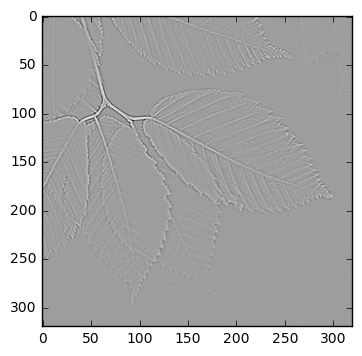

In [7]:
plt.imshow(ndimage.filters.laplace(leaves),cmap=cm.Greys_r)

## Denoising filters

Different filters can be applied in the spatial domain to remove the noise.
These filters can be found in the module `filters.rank`.

Before to start denoising the image, we need to generate some corrupted image using the noise generator from `skimage`.
For this purpose, we will use the function `util.random_noise`.

**Generate corrupted some Lena images with gaussian noise, salt & peppers noise, and speckle noise. Keep the default parameters.**

In [8]:
from skimage import util

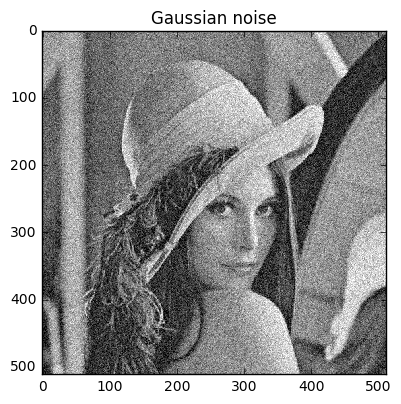

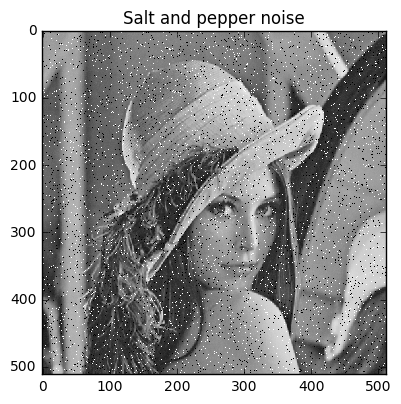

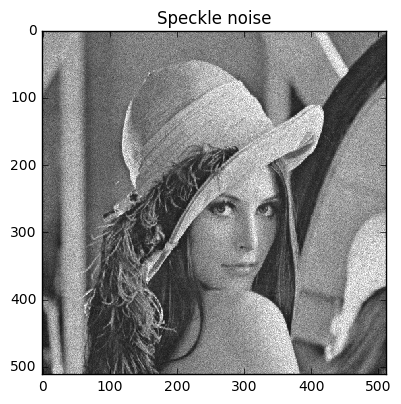

In [9]:

# Corrupt Lena
lena_gaussian = util.random_noise(lena_im, mode='gaussian')
lena_sp = util.random_noise(lena_im, mode='s&p')
lena_speckle = util.random_noise(lena_im, mode='speckle')

# Show the different corrupted Lena
plt.figure()
io.imshow(lena_gaussian)
plt.title('Gaussian noise')          
plt.figure()
io.imshow(lena_sp)
plt.title('Salt and pepper noise')
plt.figure()
io.imshow(lena_speckle)
plt.title('Speckle noise')

**Apply `median`, `mean` and `alpha-trimmed` mean filter on different corrupted Lena images with the mask corresponding to disk 1 and 3.**

 `alpha-trimmed` ([`mean_percentile`](http://scikit-image.org/docs/dev/api/skimage.filters.rank.html#skimage.filters.rank.mean_percentile)) mean filter works similar to normal mean filter. However, it considers only the grey values inside a specific range.

** mean filter: ** 

C:\Program Files\Anaconda3\lib\site-packages\skimage\util\dtype.py:110: UserWarning: Possible precision loss when converting from float64 to uint8
  "%s to %s" % (dtypeobj_in, dtypeobj))


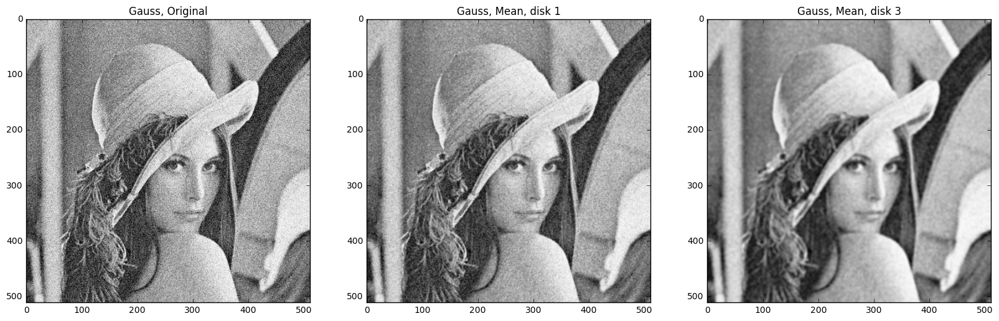

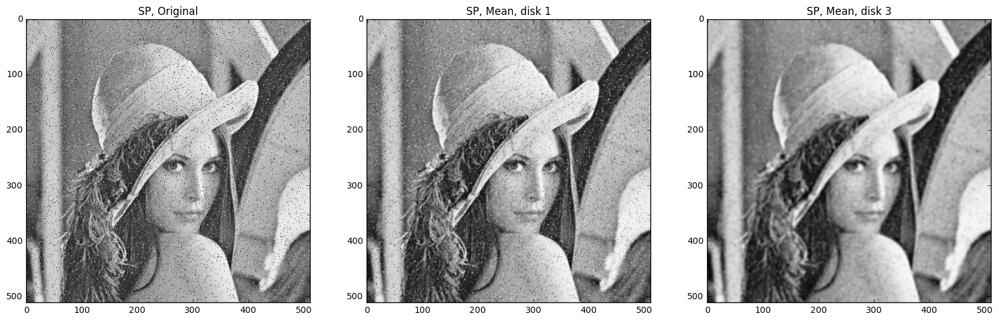

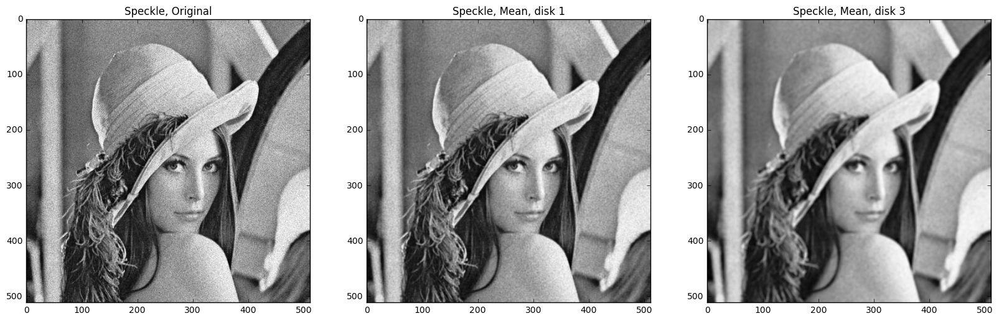

In [10]:
fig1 = plt.figure(figsize=(20,10))

a=fig1.add_subplot(1,3,1)
a.set_title('Gauss, Original')
imgplot = plt.imshow(lena_gaussian,cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,2)
a.set_title('Gauss, Mean, disk 1')
imgplot = plt.imshow(mean(lena_gaussian,disk(1)),cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,3)
a.set_title('Gauss, Mean, disk 3')
imgplot = plt.imshow(mean(lena_gaussian,disk(3)),cmap=cm.Greys_r)


fig2 = plt.figure(figsize=(20,10))

b=fig2.add_subplot(1,3,1)
b.set_title('SP, Original')
imgplot = plt.imshow(lena_sp,cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,2)
b.set_title('SP, Mean, disk 1')
imgplot = plt.imshow(mean(lena_sp,disk(1)),cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,3)
b.set_title('SP, Mean, disk 3')
imgplot = plt.imshow(mean(lena_sp,disk(3)),cmap=cm.Greys_r)


fig3 = plt.figure(figsize=(20,10))

c=fig3.add_subplot(1,3,1)
c.set_title('Speckle, Original')
imgplot = plt.imshow(lena_speckle,cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,2)
c.set_title('Speckle, Mean, disk 1')
imgplot = plt.imshow(mean(lena_speckle,disk(1)),cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,3)
c.set_title('Speckle, Mean, disk 3')
imgplot = plt.imshow(mean(lena_speckle,disk(3)),cmap=cm.Greys_r)

** alpha-trimmed mean filter: **

Apply this function on the different corrupted Lena by considering the gray value in the range [0.05, 0.95].

C:\Program Files\Anaconda3\lib\site-packages\skimage\util\dtype.py:110: UserWarning: Possible precision loss when converting from float64 to uint8
  "%s to %s" % (dtypeobj_in, dtypeobj))


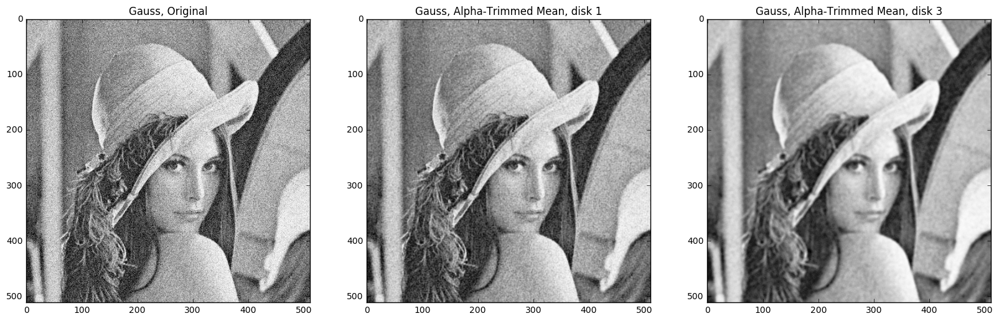

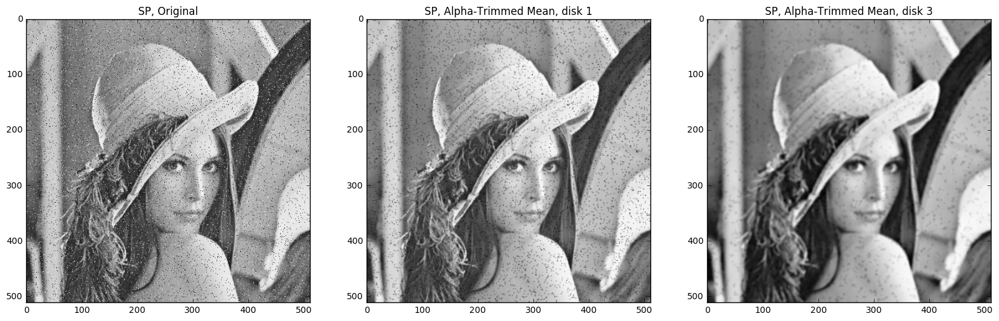

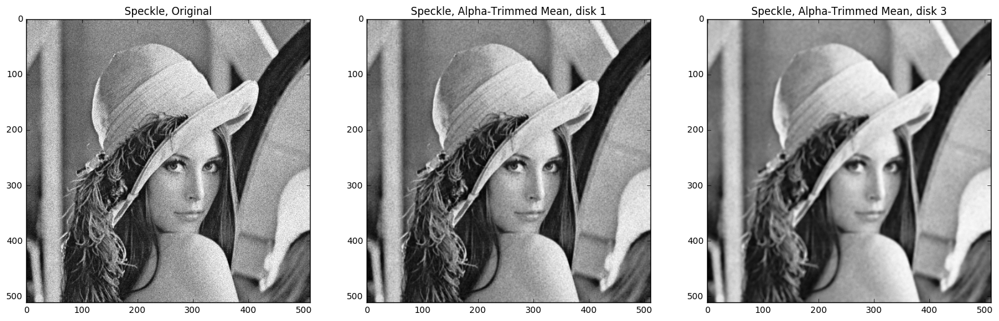

In [11]:
fig1 = plt.figure(figsize=(20,10))

a=fig1.add_subplot(1,3,1)
a.set_title('Gauss, Original')
imgplot = plt.imshow(lena_gaussian,cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,2)
a.set_title('Gauss, Alpha-Trimmed Mean, disk 1')
imgplot = plt.imshow(mean_percentile(lena_gaussian,disk(1),p0=0.05,p1=0.95),cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,3)
a.set_title('Gauss, Alpha-Trimmed Mean, disk 3')
imgplot = plt.imshow(mean_percentile(lena_gaussian,disk(3),p0=0.05,p1=0.95),cmap=cm.Greys_r)


fig2 = plt.figure(figsize=(20,10))

b=fig2.add_subplot(1,3,1)
b.set_title('SP, Original')
imgplot = plt.imshow(lena_sp,cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,2)
b.set_title('SP, Alpha-Trimmed Mean, disk 1')
imgplot = plt.imshow(mean_percentile(lena_sp,disk(1),p0=0.05,p1=0.95),cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,3)
b.set_title('SP, Alpha-Trimmed Mean, disk 3')
imgplot = plt.imshow(mean_percentile(lena_sp,disk(3),p0=0.05,p1=0.95),cmap=cm.Greys_r)


fig3 = plt.figure(figsize=(20,10))

c=fig3.add_subplot(1,3,1)
c.set_title('Speckle, Original')
imgplot = plt.imshow(lena_speckle,cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,2)
c.set_title('Speckle, Alpha-Trimmed Mean, disk 1')
imgplot = plt.imshow(mean_percentile(lena_speckle,disk(1),p0=0.05,p1=0.95),cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,3)
c.set_title('Speckle, Alpha-Trimmed Mean, disk 3')
imgplot = plt.imshow(mean_percentile(lena_speckle,disk(3),p0=0.05,p1=0.95),cmap=cm.Greys_r)

** median filter: **

C:\Program Files\Anaconda3\lib\site-packages\skimage\util\dtype.py:110: UserWarning: Possible precision loss when converting from float64 to uint8
  "%s to %s" % (dtypeobj_in, dtypeobj))


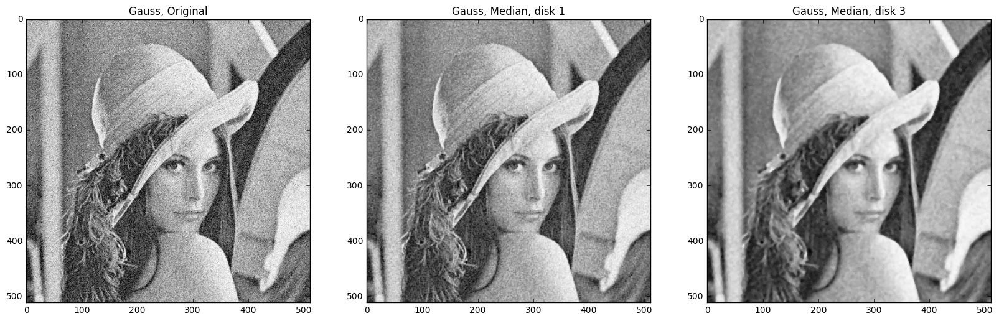

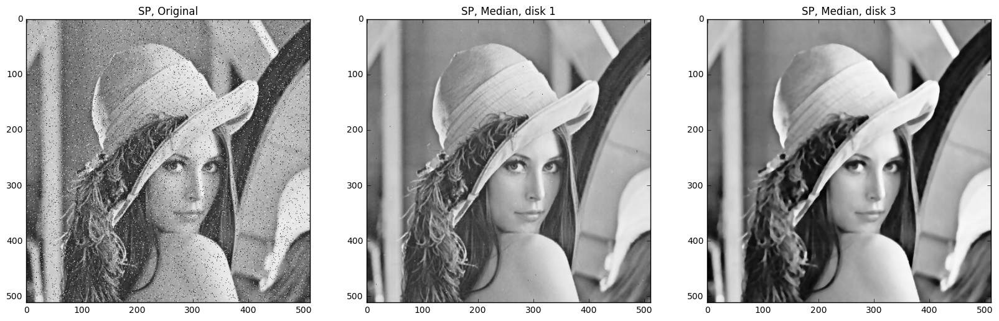

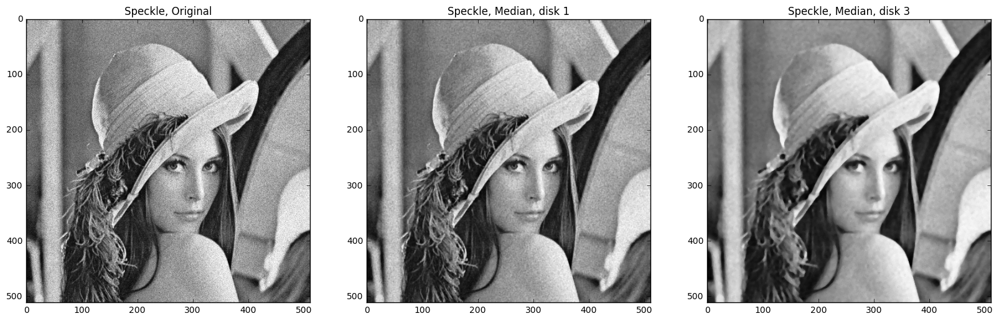

In [12]:
fig1 = plt.figure(figsize=(20,10))

a=fig1.add_subplot(1,3,1)
a.set_title('Gauss, Original')
imgplot = plt.imshow(lena_gaussian,cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,2)
a.set_title('Gauss, Median, disk 1')
imgplot = plt.imshow(median(lena_gaussian,disk(1)),cmap=cm.Greys_r)

a=fig1.add_subplot(1,3,3)
a.set_title('Gauss, Median, disk 3')
imgplot = plt.imshow(median(lena_gaussian,disk(3)),cmap=cm.Greys_r)


fig2 = plt.figure(figsize=(20,10))

b=fig2.add_subplot(1,3,1)
b.set_title('SP, Original')
imgplot = plt.imshow(lena_sp,cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,2)
b.set_title('SP, Median, disk 1')
imgplot = plt.imshow(median(lena_sp,disk(1)),cmap=cm.Greys_r)

b=fig2.add_subplot(1,3,3)
b.set_title('SP, Median, disk 3')
imgplot = plt.imshow(median(lena_sp,disk(3)),cmap=cm.Greys_r)


fig3 = plt.figure(figsize=(20,10))

c=fig3.add_subplot(1,3,1)
c.set_title('Speckle, Original')
imgplot = plt.imshow(lena_speckle,cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,2)
c.set_title('Speckle, Median, disk 1')
imgplot = plt.imshow(median(lena_speckle,disk(1)),cmap=cm.Greys_r)

c=fig3.add_subplot(1,3,3)
c.set_title('Speckle, Median, disk 3')
imgplot = plt.imshow(median(lena_speckle,disk(3)),cmap=cm.Greys_r)

## Sharpening

Use the `railway` image and sharpen the image using laplacian fitering.

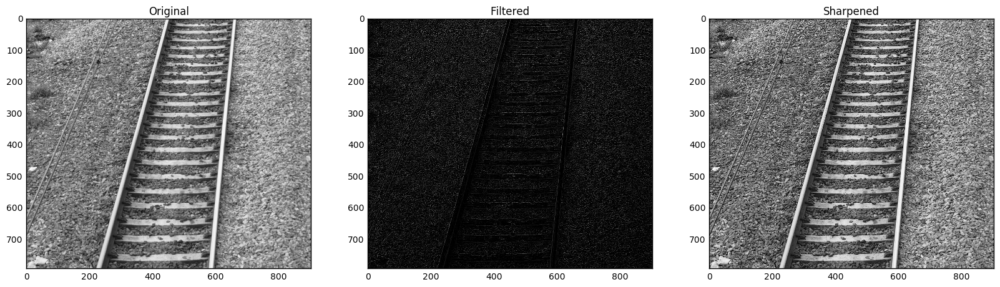

In [21]:
from skimage.exposure import rescale_intensity

fig1 = plt.figure(figsize=(20,10))

a=fig1.add_subplot(1,3,1)
a.set_title('Original')
imgplot = plt.imshow(railway,cmap=cm.Greys_r)

railway=rescale_intensity(railway, in_range=(0, 1))
laprail=ndimage.filters.laplace(railway)
laprail=img_as_float(laprail)
laprail=rescale_intensity(laprail, in_range=(0, 1))

a=fig1.add_subplot(1,3,2)
a.set_title('Filtered')
imgplot = plt.imshow(laprail,cmap=cm.Greys_r)

sharp=(railway-laprail)
sharp=rescale_intensity(result, in_range=(0, 1))

a=fig1.add_subplot(1,3,3)
a.set_title('Sharpened')
imgplot = plt.imshow(sharp,cmap=cm.Greys_r)

## Hough transform

** Define your Hough_trans function which finds the lines within an image** 

you can use either `hough_line` and `hough_line_peaks` or `probabilistic_hough_line` from [`skimage.transform`](http://scikit-image.org/docs/dev/api/skimage.transform.html). 

search a bit to know the difference between `probablistic_hough_line` and `hough_line`

Or `HoughLines` and `HoughLinesP` from [`cv2`](http://docs.opencv.org/3.0-beta/doc/py_tutorials/py_tutorials.html)


Test your function on `railway` and `building` images. 

**Note : use `skimage.feature.canny` (`cv2.canny`) edge detector to find the primary edges**

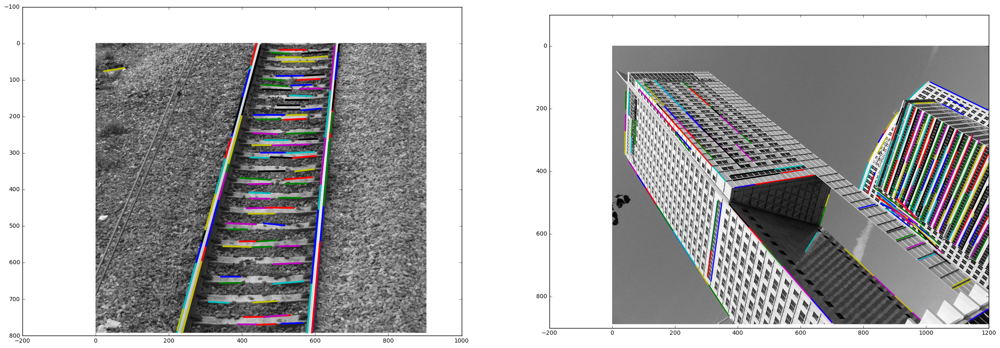

In [104]:
from skimage.feature import canny

railway=io.imread(Path.__add__('railway.jpg'))
railway=color.rgb2grey(railway)
railway = img_as_float(railway)

building=io.imread(Path.__add__('building.jpg'))
building=color.rgb2grey(building)
building = img_as_float(building)

edges = canny(railway, sigma=5)
lines = probabilistic_hough_line(edges, threshold=10,line_gap=10)

fig = plt.figure(figsize=(30,40))

a=fig.add_subplot(1,2,1)
b=fig.add_subplot(1,2,2)

a.imshow(rail,cmap='gray')

for line in lines:
    p0, p1 = line
    a.plot((p0[0], p1[0]), (p0[1], p1[1]), linewidth=3.0)
    
b.imshow(build,cmap='gray')
edges = canny(building,sigma=5)
lines = probabilistic_hough_line(edges,threshold=10,line_gap=8)

for line in lines:
    p0, p1 = line
    b.plot((p0[0], p1[0]), (p0[1], p1[1]), linewidth=2.0)
    
# "probabalistic_hough_line" is a more efficient implementation of "hough_line" similar to "HoughLinesP" from OpenCV
# It gives as output the extremes of the detected lines